**Task 3: Geospatial Analysis**

1.Visualize the locations of restaurants on a map using latitude and longitude information.

2.Analyze the distribution of restaurants across different cities or countries.

3.Determine if there is any correlation between the restaurant's location and its rating.

In [1]:
#import modules and dataset

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns;sns.set(color_codes=True)
%matplotlib inline

df = pd.read_csv(r"C:\Users\anjal\OneDrive\Desktop\CODES\Cognifyz DS Internship\Dataset.csv")

*1.Visualize the locations of restaurants on a map using latitude and longitude information.*

In [2]:
import folium
from folium.plugins import MarkerCluster


map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=2)


marker_cluster = MarkerCluster().add_to(restaurant_map)


for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name']
    ).add_to(marker_cluster)


restaurant_map


*2. Analyze the distribution of restaurants across different cities or countries.*

Top 10 Cities with Most Restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Lucknow           21
Ahmedabad         21
Amritsar          21
Guwahati          21
Name: count, dtype: int64


<Axes: title={'center': 'Top 10 Cities by Restaurant Count'}, ylabel='City'>

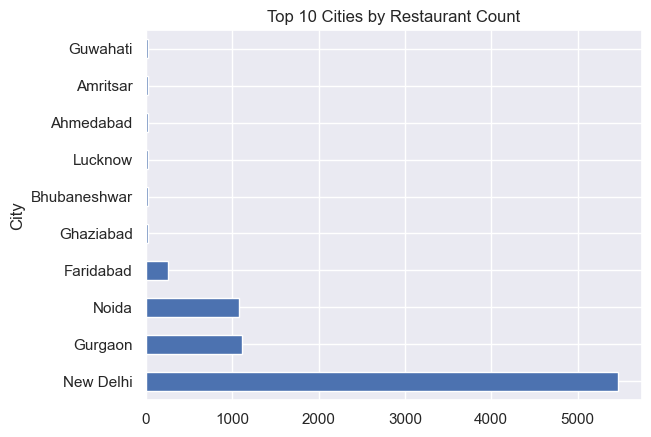

In [3]:
#By City

city_dist = df['City'].value_counts()
print("Top 10 Cities with Most Restaurants:\n", city_dist.head(10))


city_dist.head(10).plot(kind='barh', title='Top 10 Cities by Restaurant Count')



Restaurant Count by Country:
 Country
India             8652
United States      434
United Kingdom      80
Brazil              60
South Africa        60
UAE                 60
New Zealand         40
Turkey              34
Australia           24
Philippines         22
Indonesia           21
Qatar               20
Singapore           20
Sri Lanka           20
Canada               4
Name: count, dtype: int64


<Axes: title={'center': 'Restaurant Distribution by Country'}, xlabel='Country'>

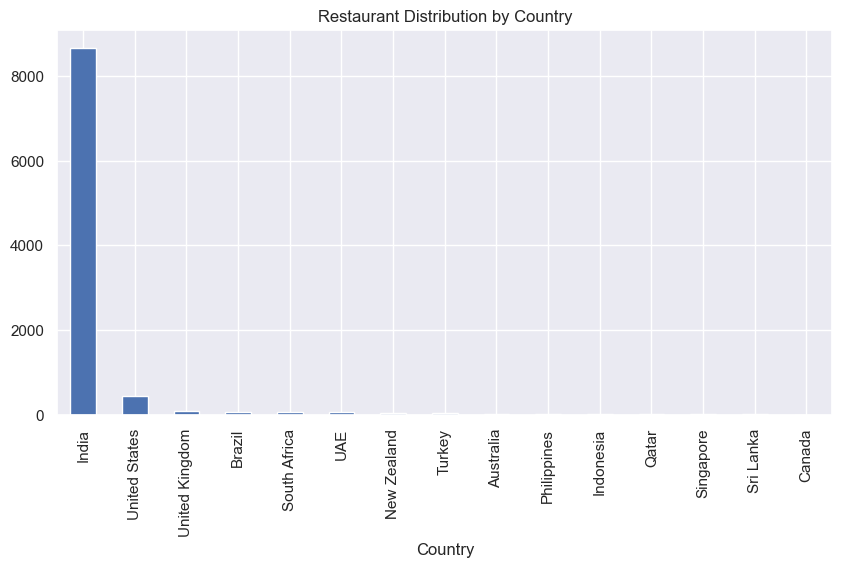

In [4]:
#By Country


country_map = {
    1: "India", 14: "Australia", 30: "Brazil", 37: "Canada", 94: "Indonesia", 
    148: "New Zealand", 162: "Philippines", 166: "Qatar", 184: "Singapore", 
    189: "South Africa", 191: "Sri Lanka", 208: "Turkey", 214: "UAE", 
    215: "United Kingdom", 216: "United States"
}

df['Country'] = df['Country Code'].map(country_map)
country_dist = df['Country'].value_counts()
print("\nRestaurant Count by Country:\n", country_dist)


country_dist.plot(kind='bar', title='Restaurant Distribution by Country', figsize=(10,5))


*3. Determine if there is any correlation between the restaurant's location and its rating.*

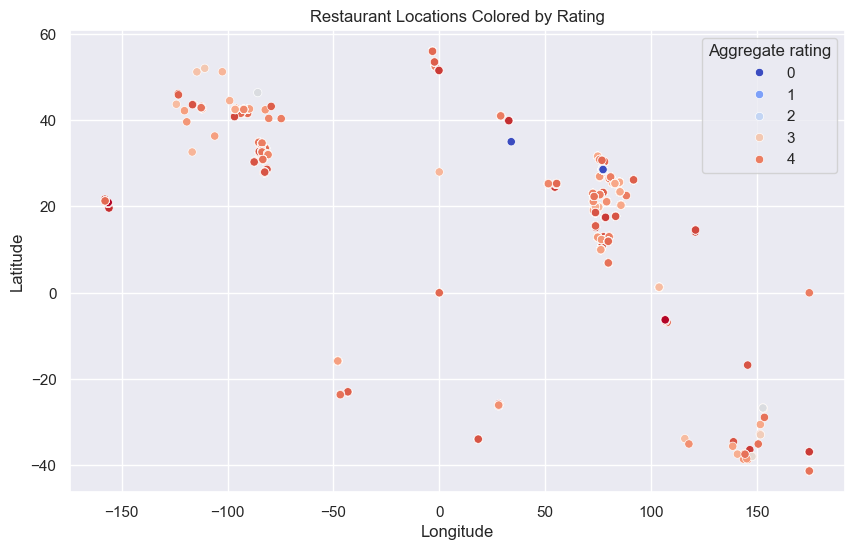

In [5]:
# A. Use a scatter plot to visualize:

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='coolwarm')
plt.title("Restaurant Locations Colored by Rating")
plt.show()

In [6]:
# B. Or calculate correlation:

correlations = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("Correlation Matrix:\n", correlations)

Correlation Matrix:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000
